## Two body problem simulation and more (three body)!

Kenetic Energy for system is:

$\begin{align}
 T = \frac12 m_1 (\dot x_1^2 + \dot y_1^2) + \frac12 m_2 (\dot x_2^2 + \dot y_2^2)
\end{align}$

Potential Energy for system is:

$\begin{align}
 U = -\frac{G m_1 m_2}{r_{12}}
\end{align}$

So, The Euler-Lagrange equation is

$\begin{align}
  \mathcal{L} = \frac12 m_1 (\dot x_1^2 + \dot y_1^2) + \frac12 m_2 (\dot x_2^2 + \dot y_2^2) + \frac{G m_1 m_2}{r_{12}}
  \;
\end{align}$

By solving Euler Euler-Lagrange equation:

$\begin{align}
 m_1 \ddot x_1 = -\frac{G m_1 m_2 (x_1-x_2)}{((x_1-x_2)^2+(y_1-y_2)^2)^{3/2}}
\end{align}$

$\begin{align}
 m_1 \ddot y_1 = -\frac{G m_1 m_2 (y_1-y_2)}{((x_1-x_2)^2+(y_1-y_2)^2)^{3/2}}
\end{align}$

$\begin{align}
 m_2 \ddot x_2 = \frac{G m_1 m_2 (x_1-x_2)}{((x_1-x_2)^2+(y_1-y_2)^2)^{3/2}}
\end{align}$

$\begin{align}
 m_2 \ddot y_2 = \frac{G m_1 m_2 (y_1-y_2)}{((x_1-x_2)^2+(y_1-y_2)^2)^{3/2}}
\end{align}$


$\begin{align}
  \mathbf{y} = \left(\begin{array}{c} x_1 (t) \\ \dot x_1(t) \\ y_1(t)\\ \dot y_1(t) \\ x_2 (t) \\ \dot x_2(t) \\ y_2(t)\\ \dot y_2(t)  \end{array} \right) 
  \qquad
  \frac{d\mathbf{y}}{dt} 
       = \left(\begin{array}{c} \dot x_1 (t) \\ \ddot x_1(t) \\ \dot y_1(t)\\ \ddot y_1(t) \\ \dot x_2 (t) \\ \ddot x_2(t) \\ \dot y_2(t)\\ \ddot y_2(t) \end{array} \right) 
       = \left(\begin{array}{c} \dot x_1 (t) \\ 
                                 -\frac{m_2(x_1-x_2)}{((x_1-x_2)^2+(y_1-y_2)^2)^{3/2}} \\ \dot y_1 (t)\\-\frac{m_2(y_1-y_2)}{((x_1-x_2)^2+(y_1-y_2)^2)^{3/2}} \\ \dot x_2 (t) \\ \frac{m_1(x_1-x_2)}{((x_1-x_2)^2+(y_1-y_2)^2)^{3/2}} \\ \dot y_2 (t) \\
                                 \frac{m_1(y_1-y_2)}{((x_1-x_2)^2+(y_1-y_2)^2)^{3/2}} \end{array} \right)
\end{align}$

In [1]:
%matplotlib inline

In [2]:
import numpy as np
from scipy.integrate import odeint, solve_ivp

import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128

In [3]:
# The dpi (dots-per-inch) setting will affect the resolution and how large
#  the plots appear on screen and printed.  So you may want/need to adjust 
#  the figsize when creating the figure.
plt.rcParams['figure.dpi'] = 100.    # this is the default for notebook

# Change the common font size (smaller when higher dpi)
font_size = 10
plt.rcParams.update({'font.size': font_size})

In [4]:
class TwoBodyOrbit:
    """
    Potentials and associated differential equations for central force motion
    with the potential U(r) = k r^n.  Several algorithms for integration of 
    ordinary differential equations are now available. 
    """
    
    def __init__(self,m1,m2,G):
        self.m1 = m1
        self.m2 = m2
        self.G = G
        
    def dy_dt(self, t, y):
        """
        This function returns the right-hand side of the diffeq: 
        vector dy/dt with 8-component
        
        Parameters
        ----------
        t : float
            time 
        y : float
            8-component vector listed at front
            
        """
        
        denomi = ((y[0]-y[4])**2+(y[2]-y[6])**2)**(3/2)   ## x1 - x2
        return [ y[1], 
                -self.G*self.m2*(y[0]-y[4])/denomi, y[3],
                -self.G*self.m2*(y[2]-y[6])/denomi,y[5],
               self.G*self.m1*(y[0]-y[4])/denomi,y[7],
               self.G*self.m1*(y[2]-y[6])/denomi]
        
    
    
    def solve_ode(self, t_pts, x1_0, x1_dot_0, y1_0, y1_dot_0, x2_0, x2_dot_0, y2_0, y2_dot_0,
                  method='RK23',
                  abserr=1.0e-8, relerr=1.0e-8):
        """
        Solve the ODE given initial conditions.
        Use solve_ivp with the option of specifying the method.
        Specify smaller abserr and relerr to get more precision.
        """
        y = [x1_0, x1_dot_0, y1_0, y1_dot_0, x2_0, x2_dot_0, y2_0, y2_dot_0]  
        solution = solve_ivp(self.dy_dt, (t_pts[0], t_pts[-1]), 
                             y, t_eval=t_pts, method=method, 
                             atol=abserr, rtol=relerr)
        x1, x1_dot, y1, y1_dot, x2, x2_dot, y2, y2_dot = solution.y
        return x1, x1_dot, y1, y1_dot, x2, x2_dot, y2, y2_dot

In [5]:
# initiate some number for object o1. 2 planets have same Mass in this system
m1 = 10.
m2 = 10.
G = 1.
o1 = TwoBodyOrbit(m1,m2,G)

# initiate some number for object o1. m4 >> m3 
m3 = 1.
m4 = 100.
o2 = TwoBodyOrbit(m3,m4,G)

# Plotting time 
t_start = 0.
t_end = 200.
delta_t = 0.001

t_pts = np.arange(t_start, t_end+delta_t, delta_t)  

# Initial conditions
x1_0, x1_dot_0 = 1., -1.
y1_0, y1_dot_0 = 1., 1.
x2_0, x2_dot_0 = -(m1 / m2) * x1_0, -(m1 / m2) * x1_dot_0
y2_0, y2_dot_0 = -(m1 / m2) * y1_0, -(m1 / m2) * y1_dot_0

x3_0, x3_dot_0 = 1., -1.
y3_0, y3_dot_0 = 1., 1.
x4_0, x4_dot_0 = -(m3 / m4) * x3_0, -(m3 / m4) * x3_dot_0
y4_0, y4_dot_0 = -(m3 / m4) * y3_0, -(m3 / m4) * y3_dot_0

x1, x1_dot, y1, y1_dot, x2, x2_dot, y2, y2_dot = o1.solve_ode(t_pts, x1_0, x1_dot_0, y1_0, y1_dot_0, x2_0, x2_dot_0, y2_0, y2_dot_0)
x3, x3_dot, y3, y3_dot, x4, x4_dot, y4, y4_dot = o2.solve_ode(t_pts, x3_0, x3_dot_0, y3_0, y3_dot_0, x4_0, x4_dot_0, y4_0, y4_dot_0)

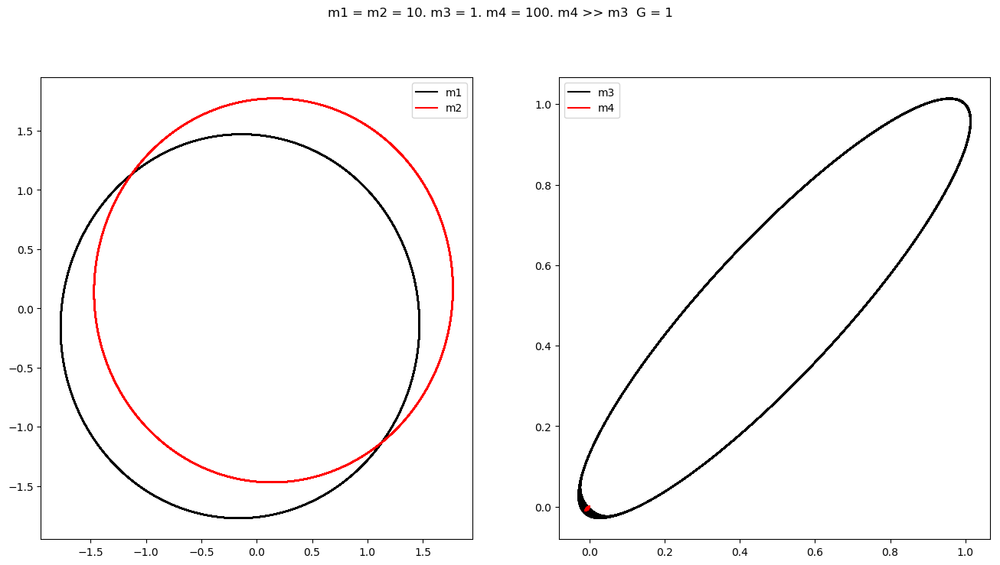

In [7]:
fig_4 = plt.figure(figsize=(16,8))

overall_title = 'm1 = m2 = 10. m3 = 1. m4 = 100. m4 >> m3  G = 1'
fig_4.suptitle(overall_title, va='baseline')

ax_4a = fig_4.add_subplot(1,2,1)
ax_4a.plot(x1, y1, color='black', label='m1')
ax_4a.plot(x2, y2, color='red', label='m2')
ax_4a.legend()

ax_4a = fig_4.add_subplot(1,2,2)
ax_4a.plot(x3, y3, color='black', label='m3')
ax_4a.plot(x4, y4, color='red', label='m4')
ax_4a.legend()

In [14]:
%%capture
## Make an animation for first situation
fig2 = plt.figure()
ax = fig2.add_subplot(111, autoscale_on=False, xlim=(-2, 2), ylim=(-2, 2))
ax.set_aspect('equal')
ax.grid()

point, = ax.plot(0,1, marker="o",label = 'm1')
point2, = ax.plot(0,1, marker="o",label = 'm2')
ax.legend()
time_template = 'time = %.1fs'
time_text = ax.text(0.05, 0.9, '', transform=ax.transAxes)


def init():
    point.set_data([], [])
    point2.set_data([], [])
    time_text.set_text('')
    return point, point2,time_text


def anim(i):
    iskip = 10*i
 
    
    point.set_data(x1[iskip], y1[iskip])
    point2.set_data(x2[iskip], y2[iskip])
    time_text.set_text(time_template % (iskip*delta_t))
    return point, point2, time_text


In [15]:
frame_interval = 1.  # time between frames
frame_number = 1001   # number of frames to include (index of t_pts)
anim = animation.FuncAnimation(fig2, 
                               anim, 
                               init_func=init,
                               frames=frame_number, 
                               interval=frame_interval, 
                               blit=True,
                               repeat=False)

In [16]:
HTML(anim.to_jshtml())  # animate using javascript

In [17]:
## Make an animation for 2nd situation

In [19]:
%%capture

fig3 = plt.figure()
ax = fig3.add_subplot(111, autoscale_on=False, xlim=(-2, 2), ylim=(-2, 2))
ax.set_aspect('equal')
ax.grid()

point, = ax.plot(0,1, marker="o",label = 'm3')
point2, = ax.plot(0,1, marker="o",label = 'm4')
ax.legend()
time_template = 'time = %.1fs'
time_text = ax.text(0.05, 0.9, '', transform=ax.transAxes)


def init():
    point.set_data([], [])
    point2.set_data([], [])
    time_text.set_text('')
    return point, point2,time_text


def anim(i):
    iskip = 2*i
 
    
    point.set_data(x3[iskip], y3[iskip])
    point2.set_data(x4[iskip], y4[iskip])
    time_text.set_text(time_template % (iskip*delta_t))
    return point, point2, time_text

In [20]:
frame_interval = 1.  # time between frames
frame_number = 1001   # number of frames to include (index of t_pts)
anim = animation.FuncAnimation(fig3, 
                               anim, 
                               init_func=init,
                               frames=frame_number, 
                               interval=frame_interval, 
                               blit=True,
                               repeat=False)

In [ ]:
HTML(anim.to_jshtml()) # Animation makes notebook too large to be uploaded So i did not run this code

In this situation, m4 >> m3, m4 can be treated as a fixed point since center of mass is extremely close to m4



## Three body problem simulation!

Kenetic Energy for system is:

$\begin{align}
 T = \frac12 m_1 (\dot x_1^2 + \dot y_1^2) + \frac12 m_2 (\dot x_2^2 + \dot y_2^2) + \frac12 m_3 (\dot x_3^2 + \dot y_3^2)
\end{align}$

Potential Energy for system is:

$\begin{align}
 U = -\frac{G m_1 m_2}{r_{12}}-\frac{G m_1 m_3}{r_{13}}-\frac{G m_2 m_3}{r_{23}}
\end{align}$

So, The Euler-Lagrange equation is

$\begin{align}
  \mathcal{L} = \frac12 m_1 (\dot x_1^2 + \dot y_1^2) + \frac12 m_2 (\dot x_2^2 + \dot y_2^2) + \frac12 m_3 (\dot x_3^2 + \dot y_3^2) +\frac{G m_1 m_2}{r_{12}}+\frac{G m_1 m_3}{r_{13}}+\frac{G m_2 m_3}{r_{23}}
  \;
\end{align}$

By solving Euler Euler-Lagrange equation:

$\begin{align}
 m_1 \ddot x_1 = -\frac{G m_1 m_2 (x_1-x_2)}{((x_1-x_2)^2+(y_1-y_2)^2)^{3/2}}-\frac{G m_1 m_3 (x_1-x_3)}{((x_1-x_3)^2+(y_1-y_3)^2)^{3/2}}
\end{align}$

$\begin{align}
 m_1 \ddot y_1 = -\frac{G m_1 m_2 (y_1-y_2)}{((x_1-x_2)^2+(y_1-y_2)^2)^{3/2}}-\frac{G m_1 m_3 (y_1-y_3)}{((x_1-x_3)^2+(y_1-y_3)^2)^{3/2}}
\end{align}$

$\begin{align}
 m_2 \ddot x_2 = \frac{G m_1 m_2 (x_1-x_2)}{((x_1-x_2)^2+(y_1-y_2)^2)^{3/2}}-\frac{G m_2 m_3 (x_2-x_3)}{((x_2-x_3)^2+(y_2-y_3)^2)^{3/2}}
\end{align}$

$\begin{align}
 m_2 \ddot y_2 = \frac{G m_1 m_2 (y_1-y_2)}{((x_1-x_2)^2+(y_1-y_2)^2)^{3/2}}-\frac{G m_2 m_3 (y_2-y_3)}{((x_2-x_3)^2+(y_2-y_3)^2)^{3/2}}
\end{align}$

$\begin{align}
 m_3 \ddot x_3 = \frac{G m_1 m_3 (x_1-x_3)}{((x_1-x_3)^2+(y_1-y_3)^2)^{3/2}}+\frac{G m_2 m_3 (x_2-x_3)}{((x_2-x_3)^2+(y_2-y_3)^2)^{3/2}}
\end{align}$

$\begin{align}
 m_3 \ddot y_3 = \frac{G m_1 m_3 (y_1-y_3)}{((x_1-x_3)^2+(y_1-y_3)^2)^{3/2}}+\frac{G m_2 m_3 (y_2-y_3)}{((x_2-x_3)^2+(y_2-y_3)^2)^{3/2}}
\end{align}$



In [28]:
class ThreeBodyOrbit:
    """
    Potentials and associated differential equations for central force motion
    with the potential U(r) = k r^n.  Several algorithms for integration of 
    ordinary differential equations are now available. 
    """
    
    def __init__(self,m1,m2,m3,G):
        self.m1 = m1
        self.m2 = m2
        self.m3 = m3
        self.G = G
        
    def dy_dt(self, t, y):
        """
        This function returns the right-hand side of the diffeq: 
        vector dy/dt with 8-component
        
        Parameters
        ----------
        t : float
            time 
        y : float
            8-component vector listed at front
            
        """
        
        denomi = ((y[0]-y[4])**2+(y[2]-y[6])**2)**(3/2)   ## x1 -x2  y1-y2
        denomi2 = ((y[0]-y[8])**2+(y[2]-y[10])**2)**(3/2) ## x1 - x3 y1 - y3
        denomi3 = ((y[4]-y[8])**2+(y[6]-y[10])**2)**(3/2) ## x2 - x3 y2 - y3
        return [ y[1], 
                -self.G*self.m2*(y[0]-y[4])/denomi-self.G*self.m3*(y[0]-y[8])/denomi2, y[3],
                -self.G*self.m2*(y[2]-y[6])/denomi-self.G*self.m3*(y[2]-y[10])/denomi2,y[5],
               self.G*self.m1*(y[0]-y[4])/denomi-self.G*self.m3*(y[4]-y[8])/denomi3,y[7],
               self.G*self.m1*(y[2]-y[6])/denomi-self.G*self.m3*(y[6]-y[10])/denomi3,y[9],
            self.G*self.m1*(y[0]-y[8])/denomi2+self.G*self.m2*(y[4]-y[8])/denomi3,y[11],
            self.G*self.m1*(y[2]-y[10])/denomi2+self.G*self.m2*(y[6]-y[10])/denomi3  
               ]
    
    
    def solve_ode(self, t_pts, x1_0, x1_dot_0, y1_0, y1_dot_0, x2_0, x2_dot_0, y2_0, y2_dot_0,x3_0, x3_dot_0,y3_0, y3_dot_0, method='RK23',
                  abserr=1.0e-8, relerr=1.0e-8):
        """
        Solve the ODE given initial conditions.
        Use solve_ivp with the option of specifying the method.
        Specify smaller abserr and relerr to get more precision.
        """
        y = [x1_0, x1_dot_0, y1_0, y1_dot_0, x2_0, x2_dot_0, y2_0, y2_dot_0,x3_0, x3_dot_0, y3_0, y3_dot_0]  
        solution = solve_ivp(self.dy_dt, (t_pts[0], t_pts[-1]), 
                             y, t_eval=t_pts, method=method, 
                             atol=abserr, rtol=relerr)
        x1, x1_dot, y1, y1_dot, x2, x2_dot, y2, y2_dot, x3, x3_dot, y3, y3_dot = solution.y
        return x1, x1_dot, y1, y1_dot, x2, x2_dot, y2, y2_dot, x3, x3_dot, y3, y3_dot

In [29]:
## Create an object
m1 = 1.
m2 = 1.
m3 = 1.
G = 1.
T1 = ThreeBodyOrbit(m1,m2,m3,G)

In [30]:
# Plotting time 
t_start = 0.
t_end = 200.
delta_t = 0.01

t_pts = np.arange(t_start, t_end+delta_t, delta_t)  
x1_0, x1_dot_0 = 0.97000436, -x3_dot_0/2.
y1_0, y1_dot_0 = -.24308753, -y3_dot_0/2.
x2_0, x2_dot_0 = - x1_0, -x3_dot_0/2.
y2_0, y2_dot_0 = - y1_0, -y3_dot_0/2.
x3_0, x3_dot_0 = 0., -.93240737
y3_0, y3_dot_0 =0., -.86473146       # I find a very classic initial condition for 3-body problem, a choreographic orbit.
x1, x1_dot, y1, y1_dot, x2, x2_dot, y2, y2_dot,x3, x3_dot, y3, y3_dot = \
T1.solve_ode(t_pts, x1_0, x1_dot_0, y1_0, y1_dot_0, x2_0, x2_dot_0, y2_0, y2_dot_0,x3_0, x3_dot_0, y3_0, y3_dot_0)

In [36]:
%%capture
# make animation for 3-body problem
fig_3body = plt.figure()
ax = fig_3body.add_subplot(111, autoscale_on=False, xlim=(-2, 2), ylim=(-2, 2))
ax.set_aspect('equal')
ax.grid()

point, = ax.plot(0,1, marker="o",label = 'm1')
point2, = ax.plot(0,1, marker="o",label = 'm2')
point3, = ax.plot(0,1, marker="o",label = 'm3')
ax.legend()
time_template = 'time = %.1fs'
time_text = ax.text(0.05, 0.9, '', transform=ax.transAxes)


def init():
    point.set_data([], [])
    point2.set_data([], [])
    point3.set_data([], [])
    time_text.set_text('')
    return point, point2,point3,time_text


def anim(i):
    iskip = 2*i
 
    
    point.set_data(x1[iskip], y1[iskip])
    point2.set_data(x2[iskip], y2[iskip])
    point3.set_data(x3[iskip], y3[iskip])  
    time_text.set_text(time_template % (delta_t))
    return point, point2, point3, time_text

In [37]:

frame_interval = 1.  # time between frames
frame_number = 1001   # number of frames to include (index of t_pts)
anim = animation.FuncAnimation(fig_3body, 
                               anim, 
                               init_func=init,
                               frames=frame_number, 
                               interval=frame_interval, 
                               blit=True,
                               repeat=False)

In [ ]:
HTML(anim.to_jshtml())  # Animation makes notebook too large to be uploaded So i did not run this code